<a href="https://colab.research.google.com/github/hiroko-gion/NYC-Housing-Quality-DataWarehouse/blob/main/DW_Project_ETL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Prior to exporting data in the drive, some filters were applied and some columns were removed on both of the datasets.**

**311_Service_Requests_from_2010_to_Present.csv**

**Filters applied:**
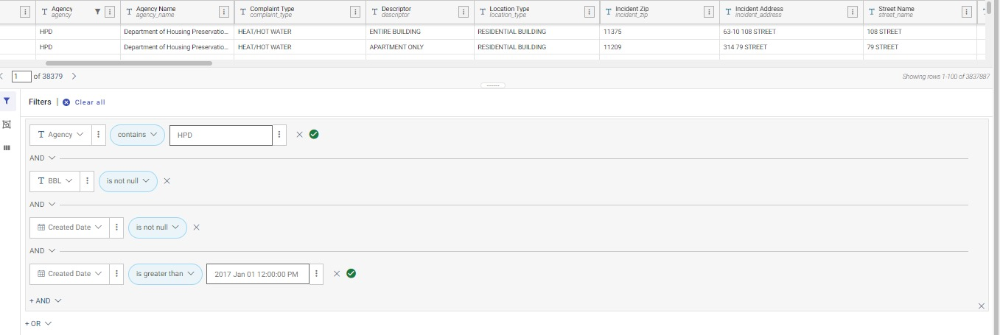


**Columns removed:**

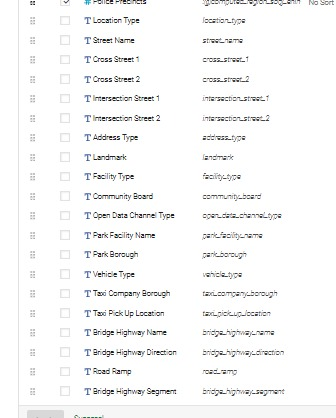


**Housing_Maintenance_Code_Violations.csv**

**Filters applied:**
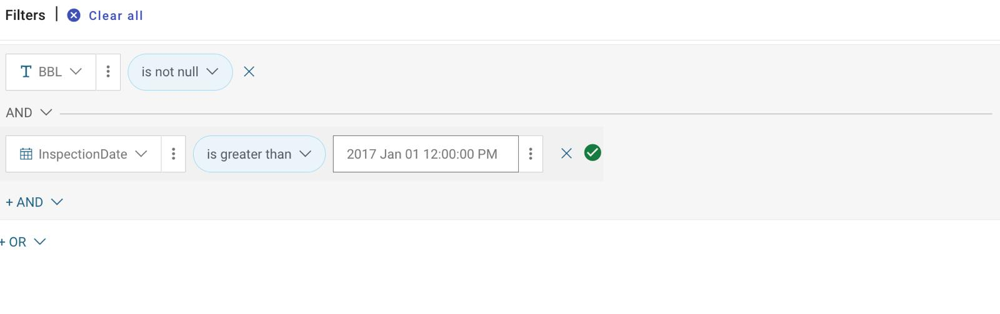


**Columns removed:**
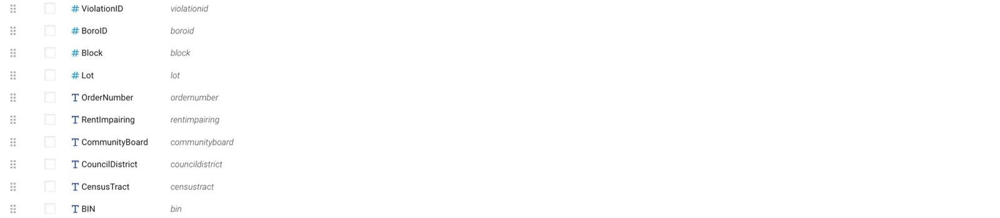

# Data Extraction
Extracting data from a CSV file.

Mounted file path onto the Google Drive.  Imported the data and only use a random sample of 25% with pandas.sample().

In [ ]:
import pandas as pd
import requests
from io import StringIO  # Required for handling CSV string as file-like object
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
os.chdir('/content/drive/MyDrive/MSBA/CIS 9440: Data Warehousing/CIS 9440: Group Project/Colab folder/Datasets')
os.listdir()

In [ ]:
df_311 =pd.read_csv('311_Service_Requests_from_2010_to_Present.csv')
df_violations=pd.read_csv('Housing_Maintenance_Code_Violations-revised.csv')

<ipython-input-7-e557a19dab1a>:2: DtypeWarning: Columns (6,12,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  df_violations=pd.read_csv('Housing_Maintenance_Code_Violations-revised.csv')


In [ ]:
df_311 = df_311.sample(frac=0.25, replace=True, random_state=1)
df_violations = df_violations.sample(frac=0.25, replace=True, random_state=1)

# Calling Dataframe
The function handle retrieving CSV data from the drive and loading it into a DataFrame using 'pandas'.

In [ ]:
print(df_311.shape)
print(df_violations.shape)

(959472, 27)
(1165387, 28)


In [ ]:
# Check if the DataFrames are not None before using them further
if df_311 is not None:
    # Process df_311
    print(df_311.describe())  # Display the summary statistics

         Unique Key  Incident Zip  Due Date           BBL  \
count  3.837887e+06  3.837609e+06       0.0  3.837887e+06   
mean   4.740144e+07  1.071753e+04       NaN  2.437637e+09   
std    7.611544e+06  5.100475e+02       NaN  1.021438e+09   
min    3.514388e+07  1.000100e+04       NaN  0.000000e+00   
25%    4.032555e+07  1.045200e+04       NaN  2.025050e+09   
50%    4.801435e+07  1.046700e+04       NaN  2.043170e+09   
75%    5.410950e+07  1.122100e+04       NaN  3.050640e+09   
max    5.949670e+07  1.234500e+04       NaN  5.080490e+09   

       X Coordinate (State Plane)  Y Coordinate (State Plane)      Latitude  \
count                3.837609e+06                3.837609e+06  3.837609e+06   
mean                 1.006527e+06                2.159693e+05  4.075942e+01   
std                  1.581547e+04                3.282027e+04  9.008107e-02   
min                  9.142830e+05                1.214640e+05  4.049982e+01   
25%                  9.976310e+05                1.8478

In [ ]:
# See if function above works to extract datasets (violations)
if df_violations is not None:
    # Process df_violations
    print(df_violations.describe())  # Display the summary statistics

        ViolationID      Postcode         NOVID  CurrentStatusID  \
count  4.661549e+06  4.660621e+06  4.214291e+06     4.661549e+06   
mean   1.400751e+07  1.077568e+04  7.140522e+06     1.310770e+01   
std    1.395145e+06  5.584804e+02  9.184867e+05     8.423799e+00   
min    1.159357e+07  1.000100e+04  5.652212e+06     1.000000e+00   
25%    1.279998e+07  1.045300e+04  6.349884e+06     9.000000e+00   
50%    1.400703e+07  1.110100e+04  7.071482e+06     9.000000e+00   
75%    1.521420e+07  1.122300e+04  7.946122e+06     1.900000e+01   
max    8.042132e+07  1.136980e+05  8.767638e+06     5.000000e+01   

           Latitude     Longitude           BBL  
count  4.661532e+06  4.661532e+06  4.661549e+06  
mean   4.074826e+01 -7.392310e+01  2.499679e+09  
std    8.981176e-02  5.474285e-02  9.839615e+08  
min    4.049905e+01 -7.425154e+01  0.000000e+00  
25%    4.066821e+01 -7.395398e+01  2.026770e+09  
50%    4.074361e+01 -7.392471e+01  3.008080e+09  
75%    4.083452e+01 -7.389322e+01  3.

# Data Profiling
## Installing libraries need for Data Profiling

In [ ]:
# Installing ydata-profiling package
!pip install -U ydata-profiling[notebook]==4.0.0 matplotlib==3.6.0

In [ ]:
# Import the module
from ydata_profiling import ProfileReport

# Starting Data Profiling
## sample_data_profiling()
The function aims to create a statistical profile report for a subset of data (sample) from the provided DataFrame (df).

It provides insights into the data's characteristics, distribution, and potential issues, aiding in exploratory data analysis and understanding the dataset's structure and content.

Set the sample size to be 10,000 since the dataset is big.

In [ ]:
def sample_data_profiling(df, df_name: str, sample_size: int = 10000):
    if sample_size > len(df):
        sample_size = len(df)  # Limit sample size to the dataframe length

    sample = df.sample(n=sample_size, replace=(sample_size > len(df)))

    profile = ProfileReport(sample, minimal=True)
    profile.to_file(f"{df_name}_profile.html")
    profile.to_widgets()

In [ ]:
# Calling the function with 311 dataframe
sample_data_profiling(df_311, '311_service_requests', sample_size=10000)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:495: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Calling the function with violations dataframe
sample_data_profiling(df_violations, 'housing_code_violations', sample_size=10000)

# Data Profiling

## detailed_data_profiling function
The function conducts a comprehensive data profiling analysis on our DataFrame.

The purpose of this function is to give an overview and detailed insights into the structure and content of our DataFrame.

Helping to identify potential issues like **missing values, duplicates, and the statistical distribution of numerical data**.

This kind of profiling is beneficial during the initial exploratory phase of data analysis to understand the characteristics of the dataset and plan the necessary data preprocessing steps.

In [ ]:
def detailed_data_profiling(df, df_name:str):
    print('='*10)                                       # Separator for easier view
    print(f"{df_name} -- data profiling:")              # Title name for the profiling
    print(f"number of rows {df.shape[0]}")              # Numbers of rows in the df
    print(f"number of columns {df.shape[1]}")           # Numbers of columns in the df
    print('-'*5)                                        # Separator
    print(f"column names: {df.columns}")                # Column names in the df
    print('-'*5)                                        # Separator
    print("column data types:")                         # Column data types in the df
    for i in df.columns:                                # Looping through columns in the df to identify data type
        print(f"{i} -- dtype: {df[i].dtypes}")          # Printing data type
    print('-'*5)                                        # Separator
    print("Columns with null values:")                  # Shows columns with null valles
    print(df.isnull().sum())                            # Counting null vallues in each column
    print('-'*5)                                        # Separator
    print("the percentage of nulls in every column:")   # the percentage of nulls in every column
    print(df.isna().sum()/(len(df))*100)                # Calculate the percentage
    print('-'*5)                                        # Separator
    print("number of duplicate rows:")                  # number of duplicate rows
    print(df.duplicated().sum())                        # Counting duplicates
    print('-'*5)                                        # Separator
    print("numeric column statistics:")                 # numeric column statistics
    print(df.describe())                                # Statistics applied in numeric columns
    print('='*10)                                       # Separator

In [ ]:
# Calling the function with 311 dataframe
detailed_data_profiling(df_311, '311_service_requests')

311_service_requests -- data profiling:
number of rows 3837887
number of columns 26
-----
column names: Index(['Unique Key', 'Created Date', 'Closed Date', 'Agency', 'Agency Name',
       'Complaint Type', 'Descriptor', 'Incident Zip', 'Incident Address',
       'City', 'Status', 'Due Date', 'Resolution Description',
       'Resolution Action Updated Date', 'BBL', 'Borough',
       'X Coordinate (State Plane)', 'Y Coordinate (State Plane)', 'Latitude',
       'Longitude', 'Location', 'Zip Codes', 'Community Districts',
       'Borough Boundaries', 'City Council Districts', 'Police Precincts'],
      dtype='object')
-----
column data types:
Unique Key -- dtype: int64
Created Date -- dtype: object
Closed Date -- dtype: object
Agency -- dtype: object
Agency Name -- dtype: object
Complaint Type -- dtype: object
Descriptor -- dtype: object
Incident Zip -- dtype: float64
Incident Address -- dtype: object
City -- dtype: object
Status -- dtype: object
Due Date -- dtype: float64
Resolution Desc

In [ ]:
# Calling the function with violations dataframe
detailed_data_profiling(df_violations, 'housing_code_violations')

housing_code_violations -- data profiling:
number of rows 4661549
number of columns 27
-----
column names: Index(['ViolationID', 'Borough', 'HouseNumber', 'StreetName', 'Postcode',
       'Apartment', 'Story', 'Class', 'InspectionDate', 'ApprovedDate',
       'OriginalCertifyByDate', 'OriginalCorrectByDate', 'NewCertifyByDate',
       'NewCorrectByDate', 'CertifiedDate', 'NOVID', 'NOVDescription',
       'NOVIssuedDate', 'CurrentStatusID', 'CurrentStatus',
       'CurrentStatusDate', 'NovType', 'ViolationStatus', 'Latitude',
       'Longitude', 'BBL', 'NTA'],
      dtype='object')
-----
column data types:
ViolationID -- dtype: int64
Borough -- dtype: object
HouseNumber -- dtype: object
StreetName -- dtype: object
Postcode -- dtype: float64
Apartment -- dtype: object
Story -- dtype: object
Class -- dtype: object
InspectionDate -- dtype: object
ApprovedDate -- dtype: object
OriginalCertifyByDate -- dtype: object
OriginalCorrectByDate -- dtype: object
NewCertifyByDate -- dtype: object
New

In [ ]:
# Check for trailing whitespace in all string columns in df_311
string_columns = df_311.select_dtypes(include=['object']).columns

for col in string_columns:
    trailing_whitespace = df_311[col].str.endswith(' ')
    if trailing_whitespace.any():
        print(f"Column '{col}' has trailing whitespaces.")
        print(df_311.loc[trailing_whitespace, col])
    else:
        print(f"Column '{col}' has no trailing whitespaces.")

Column 'Created Date' has no trailing whitespaces.
Column 'Closed Date' has no trailing whitespaces.
Column 'Agency' has no trailing whitespaces.
Column 'Agency Name' has no trailing whitespaces.
Column 'Complaint Type' has no trailing whitespaces.
Column 'Descriptor' has no trailing whitespaces.
Column 'Incident Address' has no trailing whitespaces.
Column 'City' has no trailing whitespaces.
Column 'Status' has no trailing whitespaces.
Column 'Resolution Description' has no trailing whitespaces.
Column 'Resolution Action Updated Date' has no trailing whitespaces.
Column 'Borough' has no trailing whitespaces.
Column 'Location' has no trailing whitespaces.


In [ ]:
# Check for trailing whitespace in all string columns in df_violations
string_columns = df_violations.select_dtypes(include=['object']).columns

for col in string_columns:
    trailing_whitespace = df_violations[col].str.endswith(' ')
    if trailing_whitespace.any():
        print(f"Column '{col}' has trailing whitespaces.")
        print(df_violations.loc[trailing_whitespace, col])
    else:
        print(f"Column '{col}' has no trailing whitespaces.")

Column 'Borough' has no trailing whitespaces.
Column 'HouseNumber' has no trailing whitespaces.
Column 'StreetName' has no trailing whitespaces.
Column 'Apartment' has no trailing whitespaces.
Column 'Story' has no trailing whitespaces.
Column 'Class' has no trailing whitespaces.
Column 'InspectionDate' has no trailing whitespaces.
Column 'ApprovedDate' has no trailing whitespaces.
Column 'OriginalCertifyByDate' has no trailing whitespaces.
Column 'OriginalCorrectByDate' has no trailing whitespaces.
Column 'NewCertifyByDate' has no trailing whitespaces.
Column 'NewCorrectByDate' has no trailing whitespaces.
Column 'CertifiedDate' has no trailing whitespaces.
Column 'NOVDescription' has no trailing whitespaces.
Column 'NOVIssuedDate' has no trailing whitespaces.
Column 'CurrentStatus' has no trailing whitespaces.
Column 'CurrentStatusDate' has no trailing whitespaces.
Column 'NovType' has no trailing whitespaces.
Column 'ViolationStatus' has no trailing whitespaces.
Column 'NTA' has no 

# Data Cleaning

## 1. Dropping unused columns and converting data types

1.   Dropping unused columns using df.drop() function. To remove specified columns from a DataFrame and create a new DataFrame without those specific columns.
2.   Filling null values
3. Correcting data types

In [ ]:
# Writing function to clean data
def data_cleansing(df,to_drop,to_fillna):

  # Create new dataframe without unneccesary columns
  dropped_df = df.drop(to_drop, axis=1)

  #Loop through the columns to fill NaN values with ""
  for column in to_fillna:
    if dropped_df[column].dtype == 'datetime64[ns]':
      dropped_df[column] = dropped_df[column].fillna(pd.to_datetime('2000-01-01 12:00:00',
               format='%Y-%m-%d %H:%M:%S'))
    else:
      dropped_df[column] = dropped_df[column].fillna("")

  return dropped_df

In [ ]:
# Dropping the following columns as they are mostly null and have no meaning in the metadata: (Zip Codes ', 'Community Districts', 'Borough Boundaries', 'City Council Districts', 'Police Precincts', 'Due Date')
# Cleaning df_311 data
dates = ["Created Date", "Closed Date", "Resolution Action Updated Date"]
to_drop = ['Zip Codes', 'Community Districts', 'Borough Boundaries', 'City Council Districts', 'Police Precincts', 'Due Date', 'Location']
to_fillna = ['Closed Date', 'Descriptor', 'Incident Zip', 'Resolution Description', 'Resolution Action Updated Date', 'X Coordinate (State Plane)', 'Y Coordinate (State Plane)', 'Latitude', 'Longitude']

# changing datatype to datetime
df_311[dates] = df_311[dates].apply(lambda x: pd.to_datetime(x, errors='coerce'))

# cleaning data
clean_311_df = data_cleansing(df_311,to_drop,to_fillna)

In [ ]:
#Dropping the additional columns not necessary for our analysis : ['Story', 'NewCertifyByDate', 'NewCorrectByDate', 'NovType', 'NTA', 'ApprovedDate', 'OriginalCertifyByDate', 'OriginalCorrectByDate', 'CertifiedDate', 'NOVIssuedDate']
# Cleaning df_violations data
dates = ['InspectionDate','CurrentStatusDate']
to_drop = ['Story', 'NewCertifyByDate', 'NewCorrectByDate', 'NovType', 'NTA', 'ApprovedDate']
to_fillna = ['Postcode', 'Apartment', 'OriginalCertifyByDate', 'OriginalCorrectByDate', 'CertifiedDate', 'NOVID', 'NOVDescription', 'NOVIssuedDate', 'Latitude', 'Longitude']

# changing datatype to datetime
df_violations[dates] = df_violations[dates].apply(lambda x: pd.to_datetime(x, errors='coerce'))

# cleaning data
clean_violations_df = data_cleansing(df_violations, to_drop, to_fillna)

# Create Dimension Tables

In [ ]:
def create_dimension(df,
                         dimension_columns:list, # [first_attribute, second, third]
                         surrogate_key_name:str,
                         surrogate_key_integer_start:int):

        print(f"-----\n creating dimension: {dimension_columns[0]}_dim")
        # copy full dataframe to create dimension from subset
        dim = df.copy()
        dim = dim[dimension_columns]

        # add surrogate key
        dim.insert(0, surrogate_key_name, range(surrogate_key_integer_start,
                                                surrogate_key_integer_start+len(dim)))

        print(f"dimension {dimension_columns[0]}_dim created with {len(dim)} rows \n-----")
        # return the dimension as a dataframe
        return dim

In [ ]:
# Creating the Building Dimension
dimBuilding = create_dimension(clean_311_df,
                         ['BBL','Incident Zip','Incident Address','City','Borough','Unique Key'],
                         'ID',
                         1000)
dimBuilding = dimBuilding.drop('ID',axis=1)

# Creating the Complaint Dimension
dimComplaint = create_dimension(clean_311_df,
                                ['Complaint Type','Status','BBL'],
                         'complaint_dim_ID',
                         5000)

# Creating the Severity Dimension
dimSeverity = create_dimension(clean_violations_df,
                                ['Class','ViolationStatus','BBL'],
                         'severity_dim_ID',
                           9000)

# Creating the Date Dimension (beginning)
dimDate_311 = create_dimension(clean_311_df,
                                ['Created Date','Closed Date','Resolution Action Updated Date','BBL'],
                         'date_dim_ID',
                           7000)

dimDate_violations = create_dimension(clean_violations_df,
                                ['InspectionDate','CurrentStatusDate','BBL'],
                         'date_dim2_ID',
                           8000)

-----
 creating dimension: BBL_dim
dimension BBL_dim created with 959472 rows 
-----
-----
 creating dimension: Complaint Type_dim
dimension Complaint Type_dim created with 959472 rows 
-----
-----
 creating dimension: Class_dim
dimension Class_dim created with 1165387 rows 
-----
-----
 creating dimension: Created Date_dim
dimension Created Date_dim created with 959472 rows 
-----
-----
 creating dimension: InspectionDate_dim
dimension InspectionDate_dim created with 1165387 rows 
-----


In [ ]:
# Merging the dimDate_311 and dimDate_violations to create a single dimDates

dimDate = dimDate_311.merge(dimDate_violations, how='inner', left_on='BBL', right_on='BBL')


In [ ]:
# Cleaning the new dimDate dimension

dates = ["Created Date","Closed Date","Resolution Action Updated Date","InspectionDate","CurrentStatusDate"]
# changing datatype to datetime
dimDate[dates] = dimDate[dates].apply(lambda x: pd.to_datetime(x, errors='coerce'))

dimDate['GA'] = ((dimDate['InspectionDate'] - dimDate['Created Date']).dt.days)
dimDate = dimDate[(dimDate['GA'] >= 0) & (dimDate['GA'] < 30)]
dimDate = dimDate.drop_duplicates(subset=['Created Date'], keep = "first")
dimDate = dimDate.drop(['date_dim_ID','date_dim2_ID','GA'], axis=1)
dimDate = dimDate.reset_index(drop = True, names=['date_dim_ID'])
dimDate = dimDate.rename_axis('date_dim_ID')
dimDate = dimDate.reset_index()

In [ ]:
# Renaming columns in our dimensions to match our Dimensional Model

dimBuilding = dimBuilding.rename(columns = {'BBL':'BBL_number','Incident Zip':'zipcode', 'Incident Address': 'address','City':'city', 'Borough':'borough'})
dimBuilding = dimBuilding.drop(['Unique Key'], axis=1)

dimComplaint = dimComplaint.rename(columns = {'Complaint Type':'complaint_type', 'Status':'complaint_status', 'BBL': 'BBL_number'})

dimSeverity = dimSeverity.rename(columns = {'Class':'severity_class_type', 'ViolationStatus':'severity_status', 'BBL': 'BBL_number'})

dimDate = dimDate.rename(columns = {'Created Date':'create_date', 'Closed Date':'closed_date',
       'Resolution Action Updated Date':'RAU_date', 'BBL':'BBL_number', 'InspectionDate':'inspection_date',
       'CurrentStatusDate':'currentStatus_date'})

## Previewing our dimension tables

In [ ]:
dimBuilding.head()

,Unnamed: 0,BBL_number,zipcode,address,city,borough
0,0,2025120041,10452.0,1011 NELSON AVENUE,BRONX,BRONX
1,1,2024820030,10451.0,751 GERARD AVENUE,BRONX,BRONX
2,2,1010780048,10019.0,530 WEST 50 STREET,NEW YORK,MANHATTAN
3,3,1005080046,10012.0,17 PRINCE STREET,NEW YORK,MANHATTAN
4,4,2033040030,10458.0,2700 GRAND CONCOURSE,BRONX,BRONX


In [ ]:
dimComplaint.head()

,complaint_dim_ID,complaint_type,complaint_status,BBL_number
0,5000,ELEVATOR,Closed,2039387501
1,5001,UNSANITARY CONDITION,Closed,3012200045
2,5002,HEAT/HOT WATER,Closed,2041780010
3,5003,HEAT/HOT WATER,Closed,1021360140
4,5004,PAINT/PLASTER,Closed,2028000006


In [ ]:
dimDate.head()

,date_dim_ID,create_date,closed_date,RAU_date,BBL_number,inspection_date,currentStatus_date
0,0,2020-09-04 07:36:23,2020-09-17 07:18:36,2020-09-17 07:18:36,2039387501,2020-09-15,2020-12-10
1,1,2022-12-02 16:04:29,2022-12-20 12:04:08,2022-12-20 00:00:00,2039387501,2022-12-09,2023-04-07
2,2,2020-12-29 20:00:20,2020-12-31 19:14:26,2020-12-31 19:14:26,2039387501,2021-01-04,2021-02-21
3,3,2021-02-14 14:47:53,2021-04-23 08:34:16,2021-04-23 00:00:00,2039387501,2021-03-12,2021-03-16
4,4,2023-05-05 14:11:35,2023-05-15 16:08:43,2023-05-15 00:00:00,2039387501,2023-05-09,2023-06-13


In [ ]:
dimSeverity.head()

,severity_dim_ID,severity_class_type,severity_status,BBL_number
0,9000,B,Open,3039510027
1,9001,B,Close,2024530035
2,9002,B,Open,3045970043
3,9003,A,Open,1019450001
4,9004,C,Close,3042719001


# Creating Fact Table


1.   Merge the dimension tables together and remove duplicates at every step. We do this to prevent overuse of RAM and the kernel from crashing.
2.   Clean up the fact table by removing unnecessary columns and updating datatypes



In [ ]:
# Create the fact table by first joining dimBuilding and dimComplaint
fact_table = dimBuilding.merge(dimComplaint, on='BBL_number', how='inner')

In [ ]:
# Drop duplicates to increase performance
fact_table = fact_table.drop_duplicates(subset=['BBL_number'], keep = "first")

In [ ]:
# Add onto the fact table by joining dimSeverity
fact_table = fact_table.merge(dimSeverity, on='BBL_number', how='inner')

In [ ]:
# Drop duplicates to increase performance
fact_table = fact_table.drop_duplicates(subset=['BBL_number'], keep = "first")

In [ ]:
# Add onto the fact table by joining dimDate
fact_table = fact_table.merge(dimDate, on='BBL_number', how='inner')

<ipython-input-14-185e9569529a>:1: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Unnamed: 0_x'} in the result is deprecated and will raise a MergeError in a future version.
  fact_table = fact_table.merge(dimDate, on='BBL_number', how='inner')


In [ ]:
# Cleaning the fact_table and correcting the datatypes

fact_table = fact_table.drop_duplicates(subset=['BBL_number'], keep = "first")
fact_table = fact_table.drop(['Unnamed: 0_x','Unnamed: 0_y'], axis=1)
fact_table = fact_table.rename_axis('factComplaintsViolations_ID')
fact_table = fact_table.reset_index()

# Changing datatype to datetime
dates = ['create_date', 'closed_date',
       'RAU_date', 'inspection_date', 'currentStatus_date']
fact_table[dates] = fact_table[dates].apply(lambda x: pd.to_datetime(x, errors='coerce'))

In [ ]:
# dropping columns that are not foreign keys to dimensions
fact_table = fact_table.drop(['zipcode', 'address', 'city', 'borough', 'complaint_type', 'complaint_status','severity_class_type',
       'severity_status', 'create_date', 'closed_date','RAU_date', 'inspection_date', 'currentStatus_date'], axis=1)

In [ ]:
fact_table.to_csv('factComplaintsViolations.csv')

# Connecting to Big Query

In [ ]:
from google.cloud import bigquery
from google.oauth2 import service_account
#from pandas_profiling import ProfileReport
#from sodapy import Socrata
import pyarrow
import json
import requests
import sys
import argparse
#import petl as etl
from datetime import datetime

In [ ]:
def establish_bigquery_connection(key_path:str,
                                      scopes_url = r'https://www.googleapis.com/auth/cloud-platform'):
        # created bigquery credentials from service account key json file
        credentials = service_account.Credentials.from_service_account_file(key_path)

        # initiate the bigquery client with the credentials
        client = bigquery.Client(credentials=credentials, project=credentials.project_id)

        # return the bigquery client
        return client

# Load Tables to Bigquery


In [ ]:
def load_table_to_bigquery(bq_client,
                               table,
                               dataset_name:str,
                               table_name:str):

        print(f"-----\n loading {table_name} to BigQuery dataset {dataset_name}")
        # define bigquery client
        client = bq_client

        # define location you will upload table to in bigquery
        table_ref = client.dataset(dataset_name).table(table_name)

        # configure load job settings
        job_config = bigquery.LoadJobConfig()
        job_config.autodetect = True
        job_config.source_format = bigquery.SourceFormat.CSV
        job_config.write_disposition = "WRITE_TRUNCATE"

        # initiate load job
        load_job = client.load_table_from_dataframe(table, table_ref,
                                                    job_config=job_config)
        load_job.result()

        # Make a BigQuery API request to check if new table was loaded successfully
        validate_table = client.get_table(table_ref)  # Make an API request.
        print(f"Loaded {validate_table.num_rows} rows and {len(validate_table.schema)} columns to {table_ref} \n-----")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
key_path = r'/content/drive/MyDrive/MSBA/CIS 9440: Data Warehousing/CIS 9440: Group Project/Colab folder/accesskey_BigQuery_connection/group7-final-project-7d96e81dd0ff.json'


In [ ]:
big_query_client = establish_bigquery_connection(key_path
                                      ,scopes_url = r'https://www.googleapis.com/auth/cloud-platform')

In [ ]:
# load dimBuilding Table to Bigquery
load_table_to_bigquery(big_query_client,
                               dimBuilding,
                               'housing_violations_dataset',
                               'dimBuilding')

-----
 loading dimBuilding to BigQuery dataset housing_violations_dataset
Loaded 959472 rows and 6 columns to group7-final-project.housing_violations_dataset.dimBuilding 
-----


In [ ]:
# load dimComplaint Table to Bigquery
load_table_to_bigquery(big_query_client,
                               dimComplaint,
                               'housing_violations_dataset',
                               'dimComplaint')

-----
 loading dimComplaint to BigQuery dataset housing_violations_dataset
Loaded 959472 rows and 5 columns to group7-final-project.housing_violations_dataset.dimComplaint 
-----


In [ ]:
# load dimSeverity Table to Bigquery
load_table_to_bigquery(big_query_client,
                               dimSeverity,
                               'housing_violations_dataset',
                               'dimSeverity')

-----
 loading dimSeverity to BigQuery dataset housing_violations_dataset
Loaded 1165387 rows and 5 columns to group7-final-project.housing_violations_dataset.dimSeverity 
-----


In [ ]:
# load dimDate Table to Bigquery
load_table_to_bigquery(big_query_client,
                               dimDate,
                               'housing_violations_dataset',
                               'dimDate')

-----
 loading dimDate to BigQuery dataset housing_violations_dataset
Loaded 339165 rows and 8 columns to group7-final-project.housing_violations_dataset.dimDate 
-----


In [ ]:
# load factComplaintsViolations Table to Bigquery
load_table_to_bigquery(big_query_client,
                               fact_table,
                               'housing_violations_dataset',
                               'factComplaintsViolations')

-----
 loading factComplaintsViolations to BigQuery dataset housing_violations_dataset
Loaded 40491 rows and 5 columns to group7-final-project.housing_violations_dataset.factComplaintsViolations 
-----
